<a href="https://colab.research.google.com/github/supritag/Kaggle-Notebooks/blob/master/SantanderCustomerTransactionPredictionKaggleSummary.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Santander Customer Transaction Prediction 

###Submitted by:  Suprita Ganesh
###NUID:  001490723
###CSYE7245: Big-Data Systems and Intelligent Analytics

##Introduction: 
Santander has provided an anonymized dataset with 200 predictor variables and confidential continuous numerical values associated with unique IDs. The goal of this competition is to associate each ID and respective given information to the binary target variable and predict if a customer will make a transaction or not. The values in each attribute are distributed more or less normally and hence is taken as authentic with little or no adulteration.Various machine learning algorithms render different results and the performance of the algorithm is measured in terms of area under the ROC curve of these models.

#Data Import and Exploratory Data Analysis

In [0]:
#Imports
import numpy as np
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt
import seaborn as sns
import gc
import os
import logging
import datetime
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import lightgbm as lgb
from tqdm import tqdm_notebook
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.model_selection import StratifiedKFold
warnings.filterwarnings('ignore')


## Loading the Dataset

####The Google Drive can be used to store large files and can get connected to Google Colaboratory by simply mounting it with the below commands, this makes easy for data to load faster and during one runtime, data is not lost even if the code crashes.

In [0]:
#Mounting the drive
from google.colab import drive
drive.mount('/content/drive') 

In [0]:
# Examining contents of a folder with the files in drive and to trace down exact location of files
!ls 'drive/My Drive/SantanderCustomer'

test.csv  train.csv


The dataset for this competition consists of 2 csv files,   

*   train.csv
*   test.csv



In [0]:
#Loading train dataset
train = pd.read_csv('/content/drive/My Drive/SantanderCustomer/train.csv')


In [0]:
train.head()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,train_2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,train_3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,train_4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104


The train dataset has 202 columns, ID_code, target and other 200 var_n columns from [0-199]

In [0]:
#Loading test dataset
test = pd.read_csv('/content/drive/My Drive/SantanderCustomer/test.csv')


In [0]:
test.head()

,ID_code,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,test_0,11.0656,7.7798,12.9536,9.4292,11.4327,-2.3805,5.8493,18.2675,2.1337,...,-2.1556,11.8495,-1.4300,2.4508,13.7112,2.4669,4.3654,10.7200,15.4722,-8.7197
1,test_1,8.5304,1.2543,11.3047,5.1858,9.1974,-4.0117,6.0196,18.6316,-4.4131,...,10.6165,8.8349,0.9403,10.1282,15.5765,0.4773,-1.4852,9.8714,19.1293,-20.9760
2,test_2,5.4827,-10.3581,10.1407,7.0479,10.2628,9.8052,4.8950,20.2537,1.5233,...,-0.7484,10.9935,1.9803,2.1800,12.9813,2.1281,-7.1086,7.0618,19.8956,-23.1794
3,test_3,8.5374,-1.3222,12.0220,6.5749,8.8458,3.1744,4.9397,20.5660,3.3755,...,9.5702,9.0766,1.6580,3.5813,15.1874,3.1656,3.9567,9.2295,13.0168,-4.2108
4,test_4,11.7058,-0.1327,14.1295,7.7506,9.1035,-8.5848,6.8595,10.6048,2.9890,...,4.2259,9.1723,1.2835,3.3778,19.5542,-0.2860,-5.1612,7.2882,13.9260,-9.1846


The test dataset has 201 columns, ID_code and other 200 var_n columns from [0-199]

In [0]:
train.shape

(200000, 202)

The train dataset has 202 columns, 200000 rows

In [0]:
test.shape

(200000, 201)

The train dataset has 201 columns, 200000 rows

####To obtain distributions of values across all attributes of the dataset


For every attribute the distribution of values are mapped onto normal distribution and the mean, standard deviation, first quartile, third quartile values are computed with maximum and minimum values present in each column

In [0]:
train.describe()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,...,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000
mean,0.100490,10.679914,-1.627622,10.715192,6.796529,11.078333,-5.065317,5.408949,16.545850,0.284162,...,3.234440,7.438408,1.927839,3.331774,17.993784,-0.142088,2.303335,8.908158,15.870720,-3.326537
std,0.300653,3.040051,4.050044,2.640894,2.043319,1.623150,7.863267,0.866607,3.418076,3.332634,...,4.559922,3.023272,1.478423,3.992030,3.135162,1.429372,5.454369,0.921625,3.010945,10.438015
min,0.000000,0.408400,-15.043400,2.117100,-0.040200,5.074800,-32.562600,2.347300,5.349700,-10.505500,...,-14.093300,-2.691700,-3.814500,-11.783400,8.694400,-5.261000,-14.209600,5.960600,6.299300,-38.852800
25%,0.000000,8.453850,-4.740025,8.722475,5.254075,9.883175,-11.200350,4.767700,13.943800,-2.317800,...,-0.058825,5.157400,0.889775,0.584600,15.629800,-1.170700,-1.946925,8.252800,13.829700,-11.208475
50%,0.000000,10.524750,-1.608050,10.580000,6.825000,11.108250,-4.833150,5.385100,16.456800,0.393700,...,3.203600,7.347750,1.901300,3.396350,17.957950,-0.172700,2.408900,8.888200,15.934050,-2.819550
75%,0.000000,12.758200,1.358625,12.516700,8.324100,12.261125,0.924800,6.003000,19.102900,2.937900,...,6.406200,9.512525,2.949500,6.205800,20.396525,0.829600,6.556725,9.593300,18.064725,4.836800
max,1.000000,20.315000,10.376800,19.353000,13.188300,16.671400,17.251600,8.447700,27.691800,10.151300,...,18.440900,16.716500,8.402400,18.281800,27.928800,4.272900,18.321500,12.000400,26.079100,28.500700


Similarly we can find distribution of values for test dataset

In [0]:
test.describe()

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,...,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000
mean,10.658737,-1.624244,10.707452,6.788214,11.076399,-5.050558,5.415164,16.529143,0.277135,7.569407,...,3.189766,7.458269,1.925944,3.322016,17.996967,-0.133657,2.290899,8.912428,15.869184,-3.246342
std,3.036716,4.040509,2.633888,2.052724,1.616456,7.869293,0.864686,3.424482,3.333375,1.231865,...,4.551239,3.025189,1.479966,3.995599,3.140652,1.429678,5.446346,0.920904,3.008717,10.398589
min,0.188700,-15.043400,2.355200,-0.022400,5.484400,-27.767000,2.216400,5.713700,-9.956000,4.243300,...,-14.093300,-2.407000,-3.340900,-11.413100,9.382800,-4.911900,-13.944200,6.169600,6.584000,-39.457800
25%,8.442975,-4.700125,8.735600,5.230500,9.891075,-11.201400,4.772600,13.933900,-2.303900,6.623800,...,-0.095000,5.166500,0.882975,0.587600,15.634775,-1.160700,-1.948600,8.260075,13.847275,-11.124000
50%,10.513800,-1.590500,10.560700,6.822350,11.099750,-4.834100,5.391600,16.422700,0.372000,7.632000,...,3.162400,7.379000,1.892600,3.428500,17.977600,-0.162000,2.403600,8.892800,15.943400,-2.725950
75%,12.739600,1.343400,12.495025,8.327600,12.253400,0.942575,6.005800,19.094550,2.930025,8.584825,...,6.336475,9.531100,2.956000,6.174200,20.391725,0.837900,6.519800,9.595900,18.045200,4.935400
max,22.323400,9.385100,18.714100,13.142000,16.037100,17.253700,8.302500,28.292800,9.665500,11.003600,...,20.359000,16.716500,8.005000,17.632600,27.947800,4.545400,15.920700,12.275800,26.538400,27.907400


We have to pre-process the data now and clean it for further usage into algorithms, first we check and clean the null values and NaN values from dataset

In [0]:
train.isnull().sum()
#Dataset has no null values

ID_code    0
target     0
var_0      0
var_1      0
var_2      0
var_3      0
var_4      0
var_5      0
var_6      0
var_7      0
var_8      0
var_9      0
var_10     0
var_11     0
var_12     0
var_13     0
var_14     0
var_15     0
var_16     0
var_17     0
var_18     0
var_19     0
var_20     0
var_21     0
var_22     0
var_23     0
var_24     0
var_25     0
var_26     0
var_27     0
          ..
var_170    0
var_171    0
var_172    0
var_173    0
var_174    0
var_175    0
var_176    0
var_177    0
var_178    0
var_179    0
var_180    0
var_181    0
var_182    0
var_183    0
var_184    0
var_185    0
var_186    0
var_187    0
var_188    0
var_189    0
var_190    0
var_191    0
var_192    0
var_193    0
var_194    0
var_195    0
var_196    0
var_197    0
var_198    0
var_199    0
Length: 202, dtype: int64

The Dataset consists of continuous values only and no null values were found . Let us now enumerate the columns of the train dataset for use into EDA

In [0]:
list(train)
#To obtain columns of dataset


['ID_code',
 'target',
 'var_0',
 'var_1',
 'var_2',
 'var_3',
 'var_4',
 'var_5',
 'var_6',
 'var_7',
 'var_8',
 'var_9',
 'var_10',
 'var_11',
 'var_12',
 'var_13',
 'var_14',
 'var_15',
 'var_16',
 'var_17',
 'var_18',
 'var_19',
 'var_20',
 'var_21',
 'var_22',
 'var_23',
 'var_24',
 'var_25',
 'var_26',
 'var_27',
 'var_28',
 'var_29',
 'var_30',
 'var_31',
 'var_32',
 'var_33',
 'var_34',
 'var_35',
 'var_36',
 'var_37',
 'var_38',
 'var_39',
 'var_40',
 'var_41',
 'var_42',
 'var_43',
 'var_44',
 'var_45',
 'var_46',
 'var_47',
 'var_48',
 'var_49',
 'var_50',
 'var_51',
 'var_52',
 'var_53',
 'var_54',
 'var_55',
 'var_56',
 'var_57',
 'var_58',
 'var_59',
 'var_60',
 'var_61',
 'var_62',
 'var_63',
 'var_64',
 'var_65',
 'var_66',
 'var_67',
 'var_68',
 'var_69',
 'var_70',
 'var_71',
 'var_72',
 'var_73',
 'var_74',
 'var_75',
 'var_76',
 'var_77',
 'var_78',
 'var_79',
 'var_80',
 'var_81',
 'var_82',
 'var_83',
 'var_84',
 'var_85',
 'var_86',
 'var_87',
 'var_88',
 'var_89

In [0]:
# Start Classification, y denotes target dataframe of one column
y = train.filter(['target'], axis=1)
y.head()

,target
0,0
1,0
2,0
3,0
4,0


For binary classification, the ID coulmn has no important discerning signal so we drop it and split dataframe into X with predictor values and y with target


In [0]:
X=train.drop(['target','ID_code'], axis = 1) #drop target and ID_code
X.head()

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,-4.9200,5.7470,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,3.1468,8.0851,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,-4.9193,5.9525,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,-5.8609,8.2450,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,6.2654,7.6784,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104


To calculate correlation of various variables and identify highly correlated variables if any and reduce computation and overfitting

In [0]:
c=X[list(X)].corr()# Correlation in various variables, Self Contribution

In [0]:
#Store correlations in c for future use
c

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
var_0,1.000000,-0.000544,0.006573,0.003801,0.001326,0.003046,6.982549e-03,0.002429,0.004962,-0.002613,...,0.002752,0.000206,-0.005373,0.001616,-0.001514,0.002073,0.004386,-0.000753,-0.005776,0.003850
var_1,-0.000544,1.000000,0.003980,0.000010,0.000303,-0.000902,3.257729e-03,0.001511,0.004098,-0.000832,...,0.006627,0.003621,-0.002604,0.001153,-0.002557,-0.000785,-0.000377,-0.004157,-0.004861,0.002287
var_2,0.006573,0.003980,1.000000,0.001001,0.000723,0.001569,8.825211e-04,-0.000991,0.002648,-0.001932,...,0.000197,0.001285,-0.003400,0.000549,0.002104,-0.001070,0.003952,0.001078,-0.000877,0.003855
var_3,0.003801,0.000010,0.001001,1.000000,-0.000322,0.003253,-7.743892e-04,0.002500,0.003553,-0.000826,...,0.000151,0.002445,-0.001530,-0.001699,-0.001054,0.001206,-0.002800,0.001164,-0.001651,0.000506
var_4,0.001326,0.000303,0.000723,-0.000322,1.000000,-0.001368,4.882529e-05,0.004549,0.001194,-0.000918,...,0.001514,0.004357,0.003347,0.000813,-0.000068,0.003706,0.000513,-0.000046,-0.001821,-0.000786
var_5,0.003046,-0.000902,0.001569,0.003253,-0.001368,1.000000,2.587780e-03,-0.000995,0.000147,-0.005279,...,0.001466,-0.000022,0.001116,-0.002237,-0.002543,-0.001274,0.002880,-0.000535,-0.000953,0.002767
var_6,0.006983,0.003258,0.000883,-0.000774,0.000049,0.002588,1.000000e+00,-0.002548,-0.001188,-0.005697,...,0.000721,0.005604,-0.002563,0.002464,-0.001141,0.001244,0.005378,-0.003565,-0.003025,0.006096
var_7,0.002429,0.001511,-0.000991,0.002500,0.004549,-0.000995,-2.547746e-03,1.000000,0.000814,0.002885,...,-0.000337,-0.003957,0.001733,0.003219,-0.000270,0.001854,0.001045,0.003466,0.000650,-0.001457
var_8,0.004962,0.004098,0.002648,0.003553,0.001194,0.000147,-1.187995e-03,0.000814,1.000000,-0.001073,...,0.002923,-0.001151,-0.000429,0.001414,0.001313,0.001396,-0.003242,-0.004583,0.002950,0.000854
var_9,-0.002613,-0.000832,-0.001932,-0.000826,-0.000918,-0.005279,-5.696919e-03,0.002885,-0.001073,1.000000,...,-0.000871,-0.002371,-0.000014,-0.001407,0.003099,-0.000868,0.000052,0.003701,0.002343,0.001070


Plot Correlation matrix for easy readability of effect of one variable's increase or decrease in value with another variable

In [0]:
    f, ax = plt.subplots(figsize=(256, 256))#Plots correlation matrix, Self Contribution
    plt.title('Correlation Matrix',fontsize=14)
    sns.heatmap(c, linewidths=0.25, vmax=1.0, square=True, cmap="RdBu_r", linecolor='k', annot=True)


All the variable are very poorly correlated to each other and hence every variable cvan be considered independent variable with no effect on any other variable or no other variable affects it

To view datasets as whole, instead of a few columns with elipsis as jupyter notebook/ colaboratory both allow limited view of all rows/ all columns


In [0]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

To understand if any values are missing and impute missing values with appropriate values according to the problem


In [0]:
def missing_data(data):
    total = data.isnull().sum()
    percent = (data.isnull().sum()/data.isnull().count()*100)
    tt = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
    types = []
    for col in data.columns:
        dtype = str(data[col].dtype)
        types.append(dtype)
    tt['Types'] = types
    return(np.transpose(tt))

In [0]:
missing_data(train) #all columns missing data with percentage compared to whole dataset


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
Total,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Percent,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Types,object,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64


No data is missing all the variables have all the values  so no need for imputing values 

In [0]:
missing_data(test)


,ID_code,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
Total,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Percent,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Types,object,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64


Similarly the test dataset als has no missing values

####To compute  distribution of Customer Transactions(1) and No Transactions(0)

In [0]:
train.groupby('target')['ID_code'].nunique() # Get exact value for this distribution of data values for both classes, Transactions/No Transactions

target
0    179902
1     20098
Name: ID_code, dtype: int64

There are 179902 No Transactons and 20098 Transactions in the given train dataset

In [0]:
#To plot value distributions of various variables across dataset 
def plot_feature_distribution(df1, df2, label1, label2, features):
    i = 0
    sns.set_style('whitegrid')
    plt.figure()
    fig, ax = plt.subplots(10,10,figsize=(18,22)) #To plot 100 plots this time

    for feature in features:
        i += 1
        plt.subplot(10,10,i) #Access each subplot
        sns.distplot(df1[feature], hist=False,label=label1)#Plot with respect to the NoTransactions 
        sns.distplot(df2[feature], hist=False,label=label2)#Plot with respect to transactions
        plt.xlabel(feature, fontsize=9)
        locs, labels = plt.xticks()
        plt.tick_params(axis='x', which='major', labelsize=6, pad=-6)
        plt.tick_params(axis='y', which='major', labelsize=6)
    plt.show();


<Figure size 576x396 with 0 Axes>

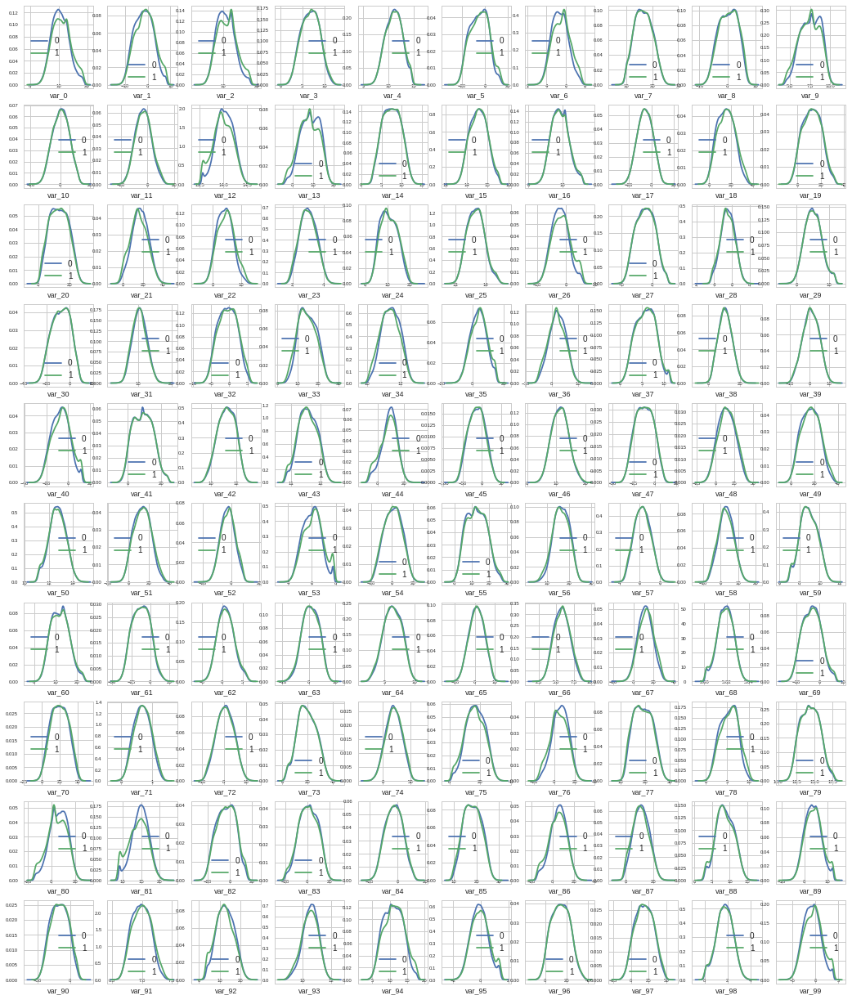

In [0]:
t0 = train.loc[train['target'] == 0]# Dataset with all Non Transactions
t1 = train.loc[train['target'] == 1]#Dataset with all Transactions
features = train.columns.values[2:102]
plot_feature_distribution(t0, t1, '0', '1', features)


<Figure size 576x396 with 0 Axes>

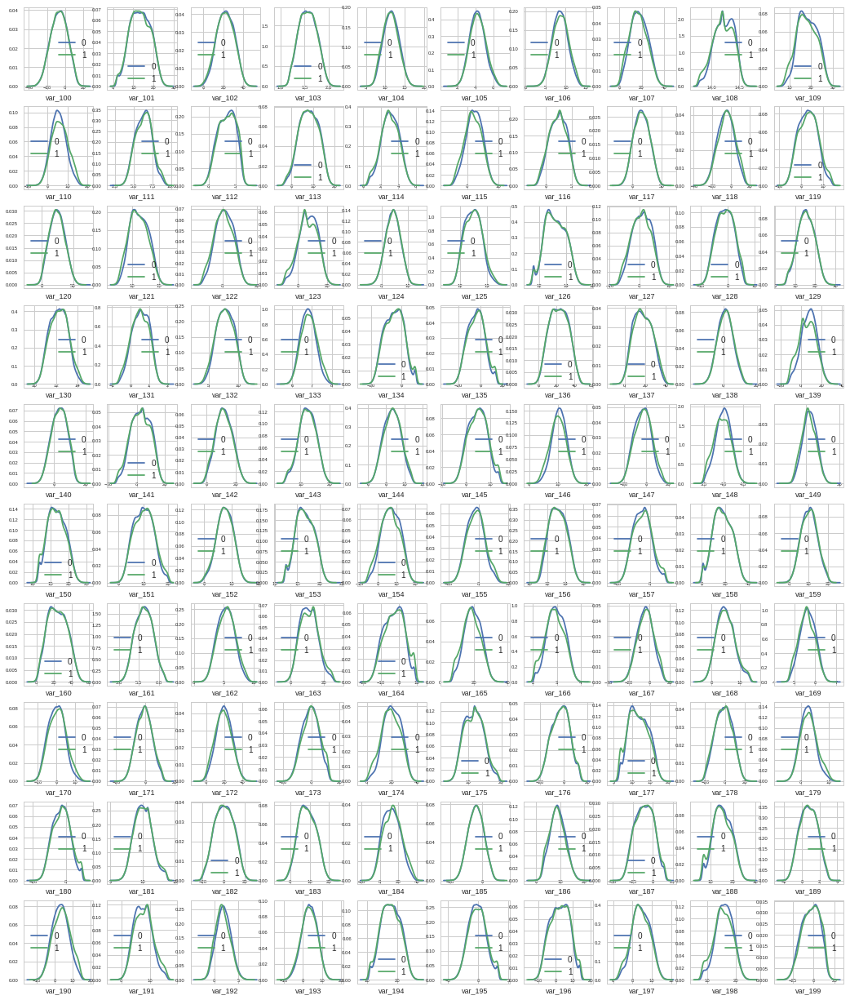

In [0]:
features = train.columns.values[102:202]#Next 100 plots
plot_feature_distribution(t0, t1, '0', '1', features)


Specific statistical plots would demonstrate the skewness, kurtosis and distribution of values across dataset and this will help in deeper insights

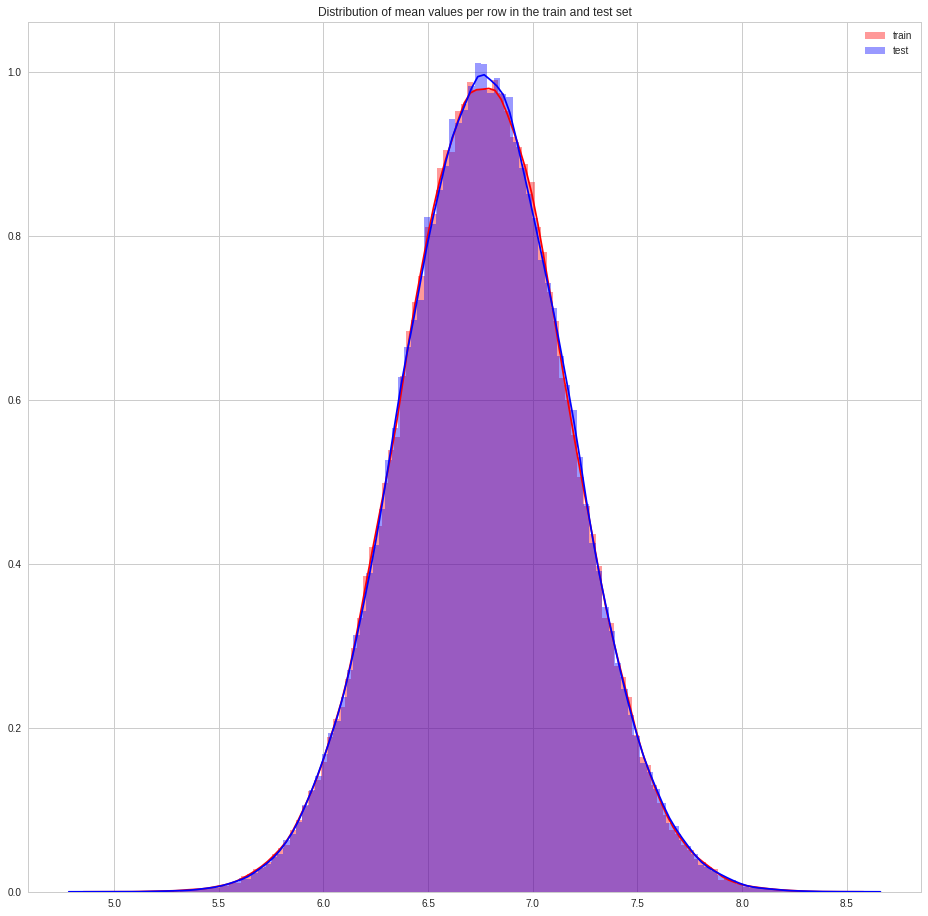

In [0]:
plt.figure(figsize=(16,16))
features = train.columns.values[2:202]
plt.title("Distribution of mean values per row in the train and test set")
sns.distplot(train[features].mean(axis=1),color="red", kde=True,bins=120, label='train')
sns.distplot(test[features].mean(axis=1),color="blue", kde=True,bins=120, label='test')
plt.legend()
plt.show()


*Uniformly* distributed

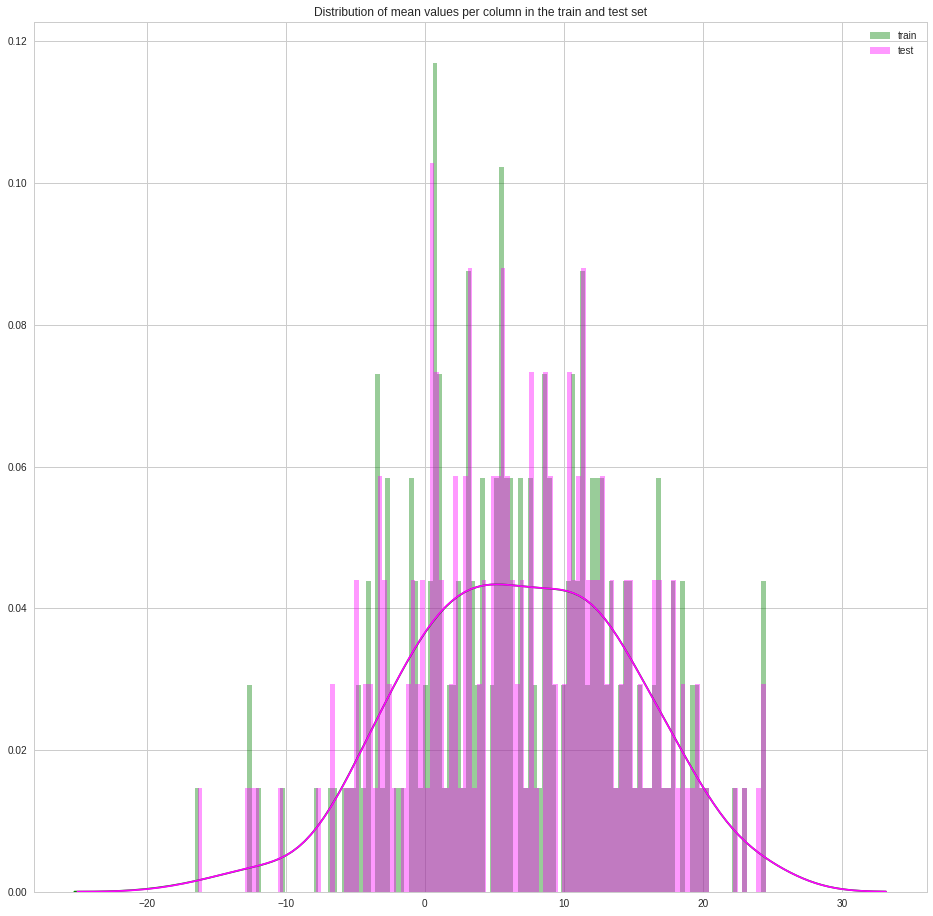

In [0]:
plt.figure(figsize=(16,16))
plt.title("Distribution of mean values per column in the train and test set")
sns.distplot(train[features].mean(axis=0),color="green",kde=True,bins=120, label='train')
sns.distplot(test[features].mean(axis=0),color="magenta", kde=True,bins=120, label='test')
plt.legend()
plt.show()


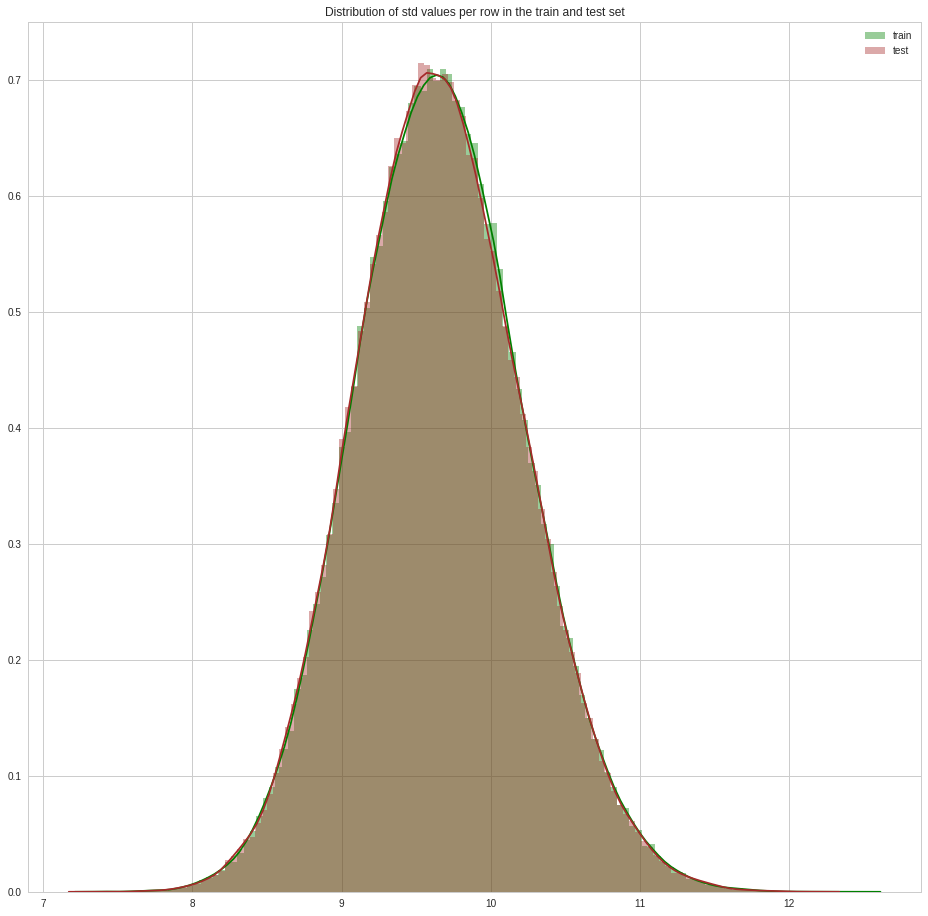

In [0]:
plt.figure(figsize=(16,16))
plt.title("Distribution of std values per row in the train and test set")
sns.distplot(train[features].std(axis=1),color="green", kde=True,bins=120, label='train')
sns.distplot(test[features].std(axis=1),color="brown", kde=True,bins=120, label='test')
plt.legend();plt.show()


*Uniformly* *Distributed*

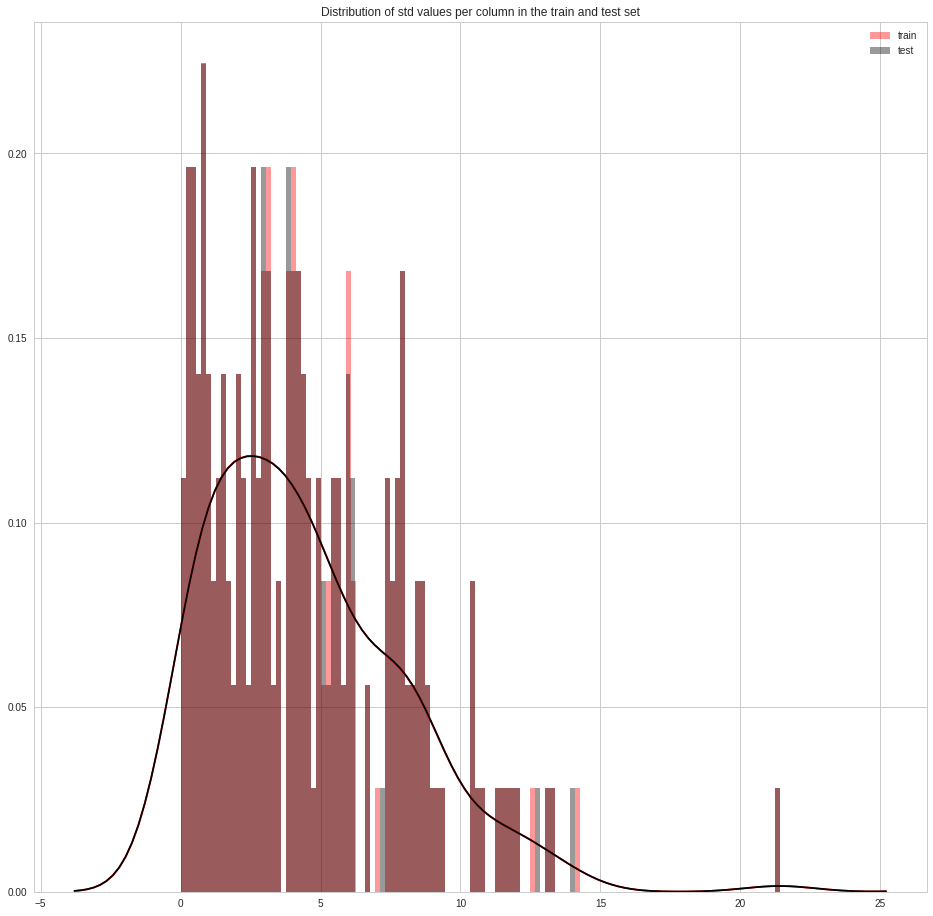

In [0]:
plt.figure(figsize=(16,16))
plt.title("Distribution of std values per column in the train and test set")
sns.distplot(train[features].std(axis=0),color="red",kde=True,bins=120, label='train')
sns.distplot(test[features].std(axis=0),color="black", kde=True,bins=120, label='test')
plt.legend(); plt.show()


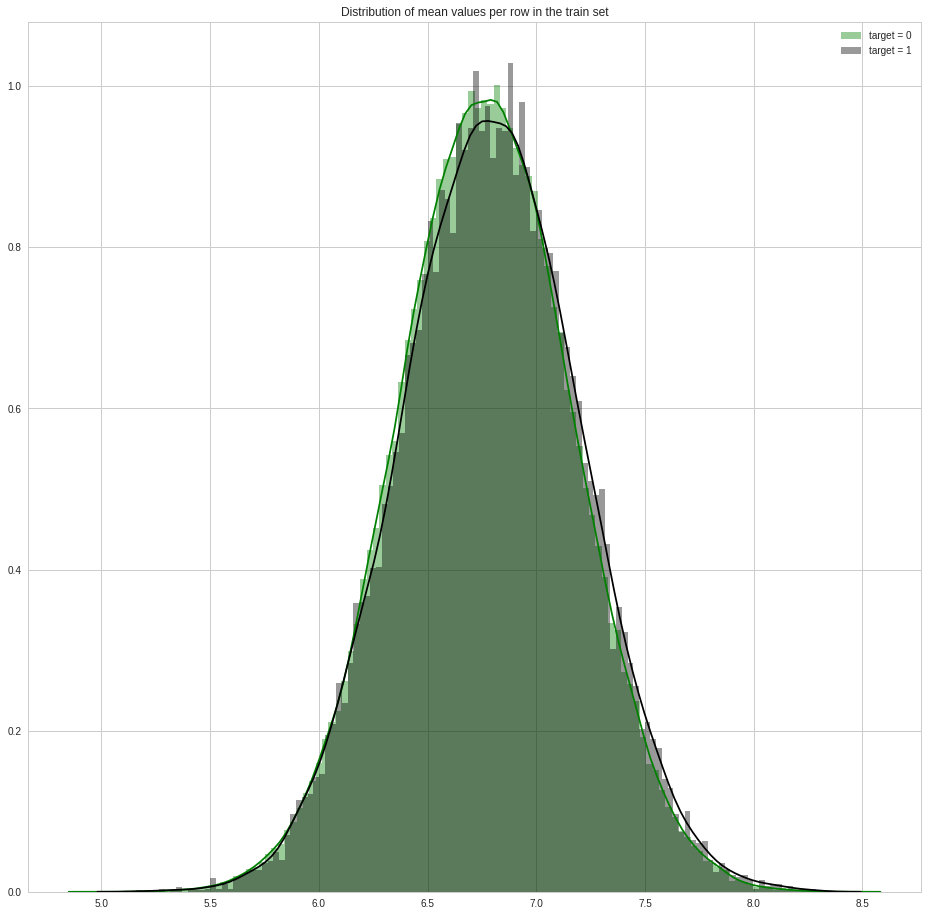

In [0]:
t0 = train.loc[train['target'] == 0]
t1 = train.loc[train['target'] == 1]
plt.figure(figsize=(16,16))
plt.title("Distribution of mean values per row in the train set")
sns.distplot(t0[features].mean(axis=1),color="green", kde=True,bins=120, label='target = 0')
sns.distplot(t1[features].mean(axis=1),color="black", kde=True,bins=120, label='target = 1')
plt.legend(); plt.show()


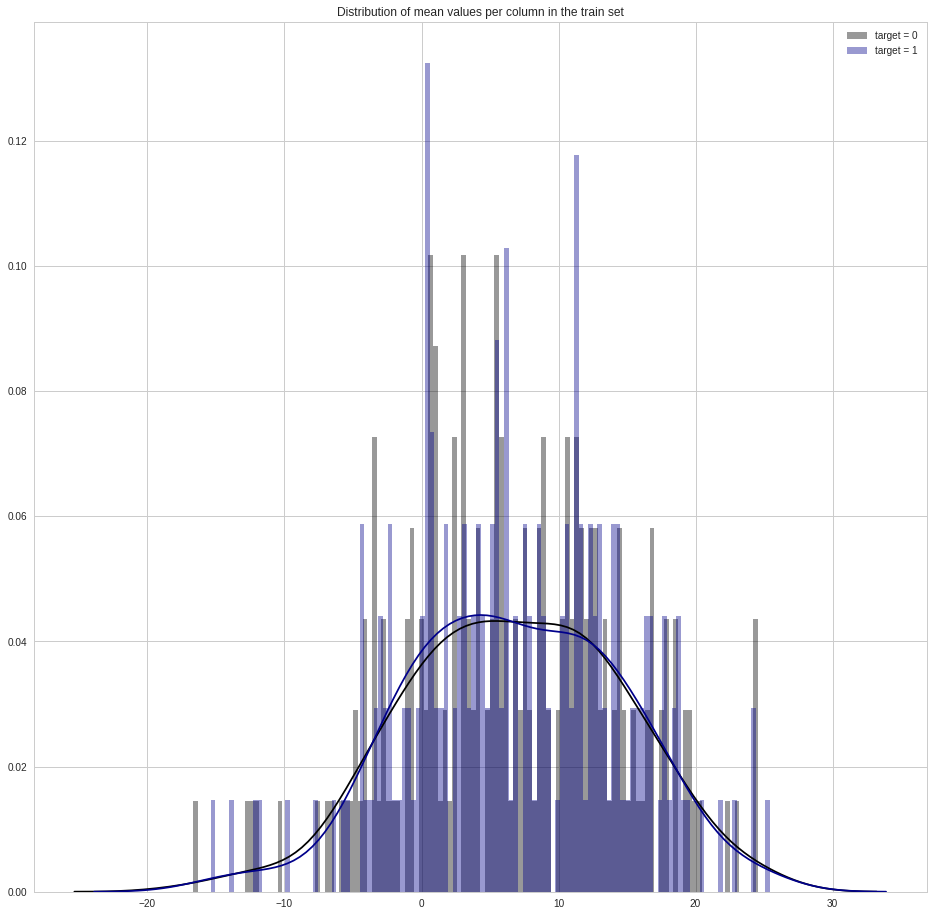

In [0]:
plt.figure(figsize=(16,16))
plt.title("Distribution of mean values per column in the train set")
sns.distplot(t0[features].mean(axis=0),color="black", kde=True,bins=120, label='target = 0')
sns.distplot(t1[features].mean(axis=0),color="darkblue", kde=True,bins=120, label='target = 1')
plt.legend(); plt.show()


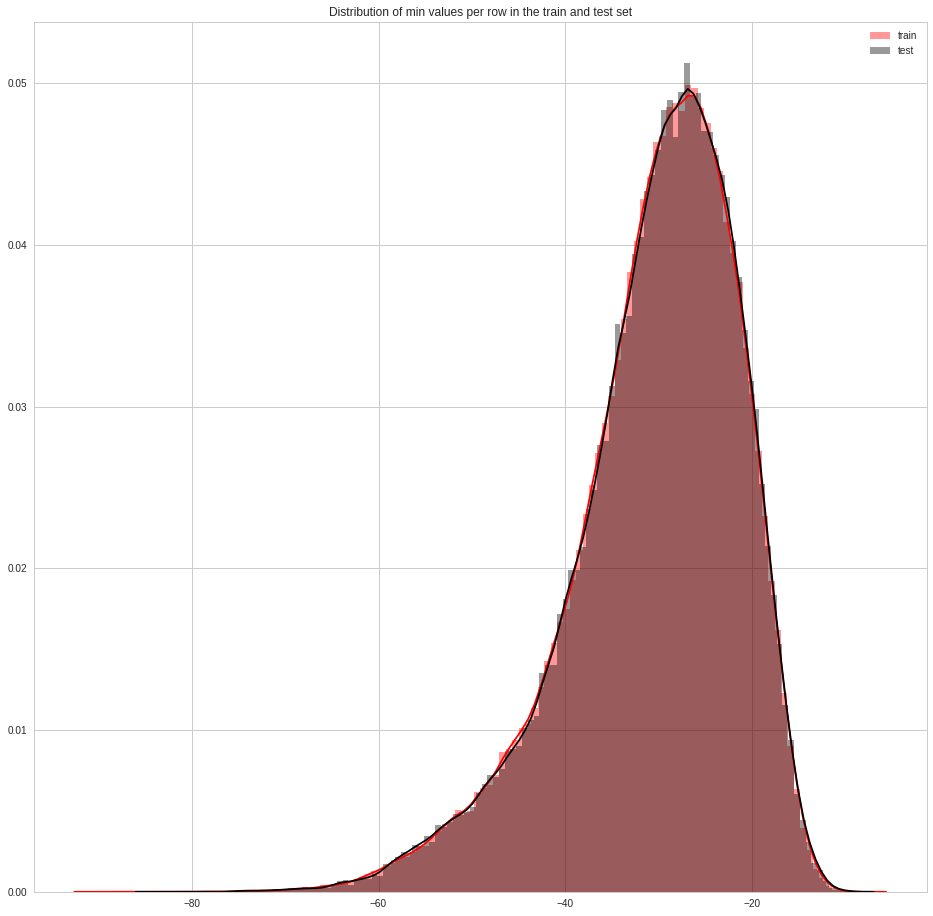

In [0]:
plt.figure(figsize=(16,16))
features = train.columns.values[2:202]
plt.title("Distribution of min values per row in the train and test set")
sns.distplot(train[features].min(axis=1),color="red", kde=True,bins=120, label='train')
sns.distplot(test[features].min(axis=1),color="black", kde=True,bins=120, label='test')
plt.legend()
plt.show()

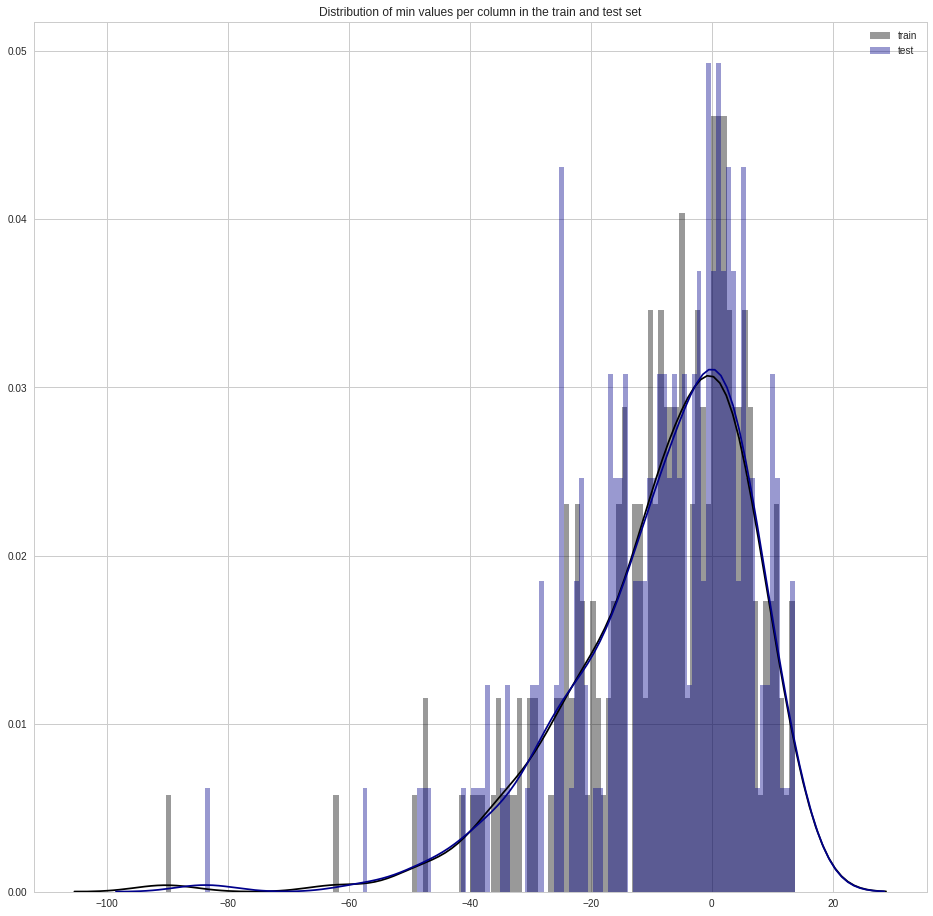

In [0]:
plt.figure(figsize=(16,16))
features = train.columns.values[2:202]
plt.title("Distribution of min values per column in the train and test set")
sns.distplot(train[features].min(axis=0),color="black", kde=True,bins=120, label='train')
sns.distplot(test[features].min(axis=0),color="darkblue", kde=True,bins=120, label='test')
plt.legend()
plt.show()


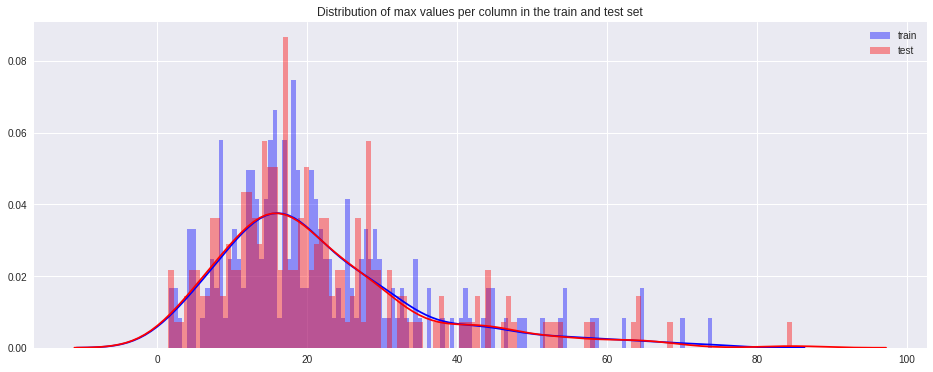

In [0]:
plt.figure(figsize=(16,6))
features = train.columns.values[2:202]
plt.title("Distribution of max values per column in the train and test set")
sns.distplot(train[features].max(axis=0),color="blue", kde=True,bins=120, label='train')
sns.distplot(test[features].max(axis=0),color="red", kde=True,bins=120, label='test')
plt.legend()
plt.show()


The spread in colum distributions of mean, min, max values suggest presence of authentic data which is very rich in content for analysis and every column has its own significance with output

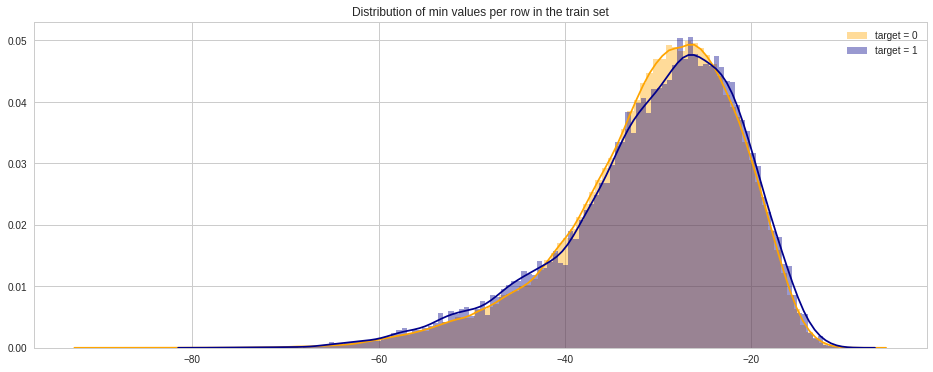

In [0]:
t0 = train.loc[train['target'] == 0]
t1 = train.loc[train['target'] == 1]
plt.figure(figsize=(16,6))
plt.title("Distribution of min values per row in the train set")
sns.distplot(t0[features].min(axis=1),color="orange", kde=True,bins=120, label='target = 0')
sns.distplot(t1[features].min(axis=1),color="darkblue", kde=True,bins=120, label='target = 1')
plt.legend(); plt.show()


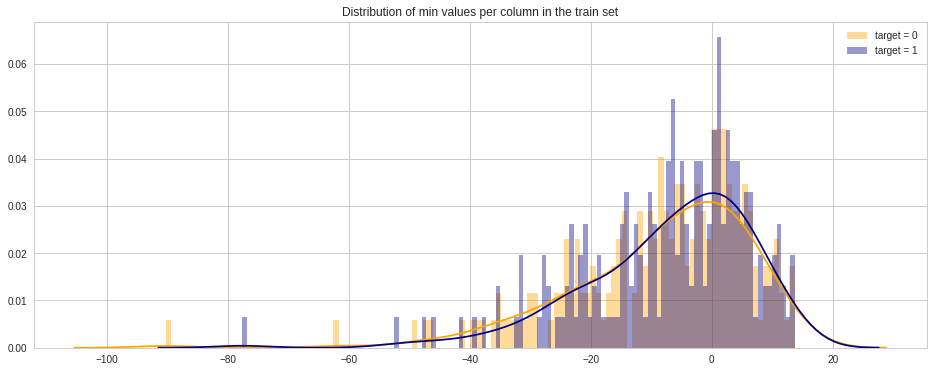

In [0]:
plt.figure(figsize=(16,6))
plt.title("Distribution of min values per column in the train set")
sns.distplot(t0[features].min(axis=0),color="orange", kde=True,bins=120, label='target = 0')
sns.distplot(t1[features].min(axis=0),color="darkblue", kde=True,bins=120, label='target = 1')
plt.legend(); plt.show()


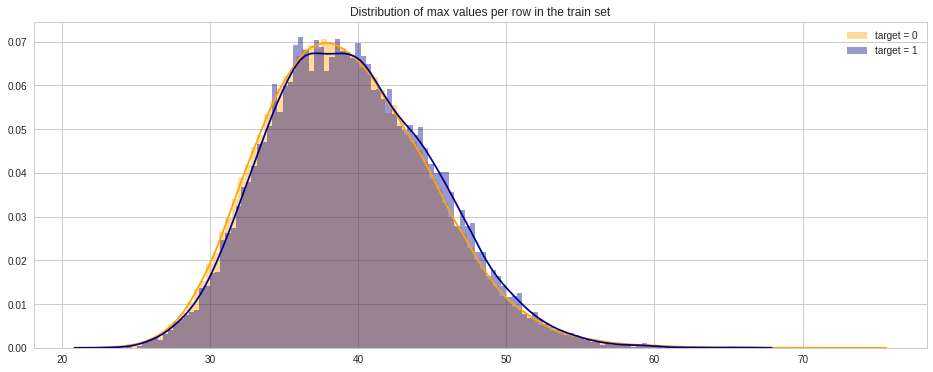

In [0]:
plt.figure(figsize=(16,6))
plt.title("Distribution of max values per row in the train set")
sns.distplot(t0[features].max(axis=1),color="orange", kde=True,bins=120, label='target = 0')
sns.distplot(t1[features].max(axis=1),color="darkblue", kde=True,bins=120, label='target = 1')
plt.legend(); plt.show()


The uniform row distributions suggest the presence of fake ID_code rows that are appended to maintain security by Santander, This fake data can lead to wrong classifications and hence need to be filtered

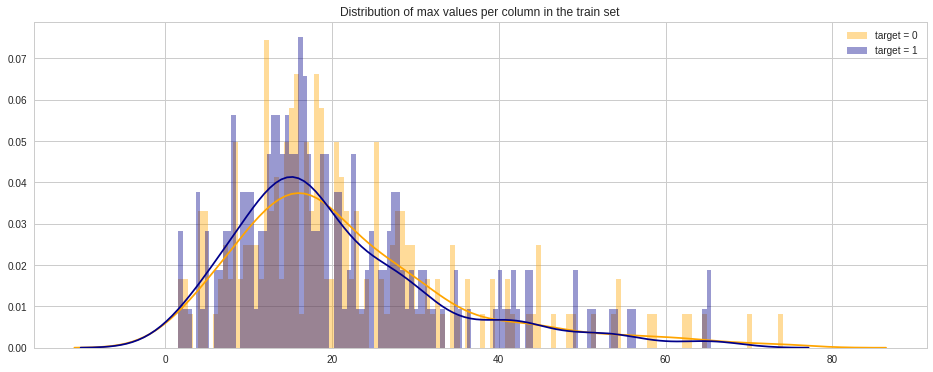

In [0]:
plt.figure(figsize=(16,6))
plt.title("Distribution of max values per column in the train set")
sns.distplot(t0[features].max(axis=0),color="orange", kde=True,bins=120, label='target = 0')
sns.distplot(t1[features].max(axis=0),color="darkblue", kde=True,bins=120, label='target = 1')
plt.legend(); plt.show()


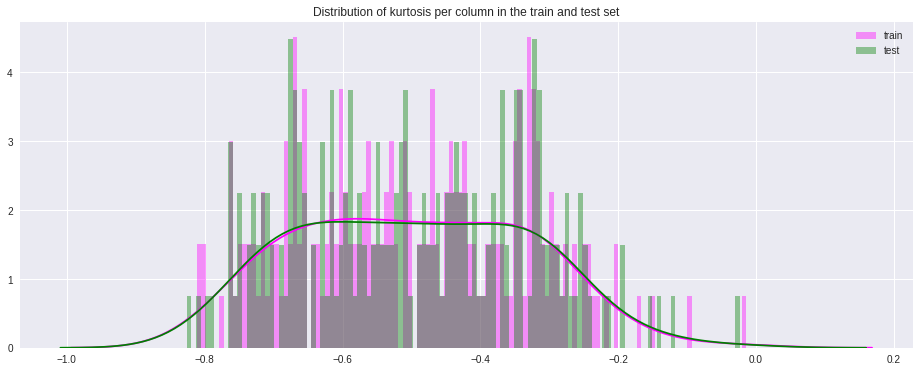

In [0]:
plt.figure(figsize=(16,6))
plt.title("Distribution of kurtosis per column in the train and test set")
sns.distplot(train[features].kurtosis(axis=0),color="magenta", kde=True,bins=120, label='train')
sns.distplot(test[features].kurtosis(axis=0),color="green", kde=True,bins=120, label='test')
plt.legend()
plt.show()


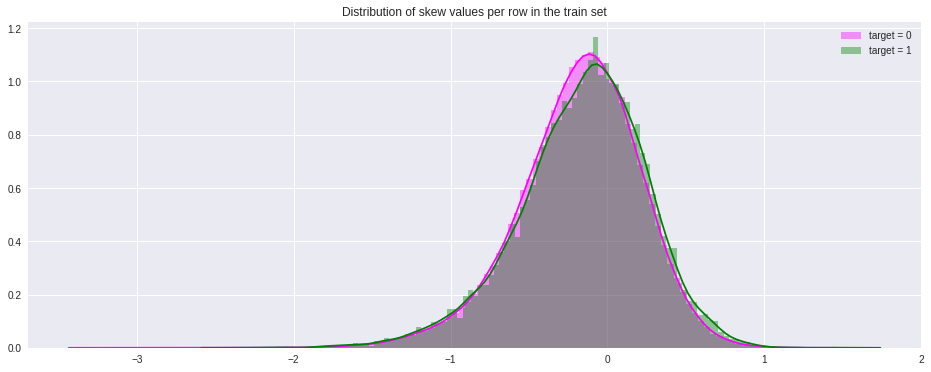

In [0]:
t0 = train.loc[train['target'] == 0]
t1 = train.loc[train['target'] == 1]
plt.figure(figsize=(16,6))
plt.title("Distribution of skew values per row in the train set")
sns.distplot(t0[features].skew(axis=1),color="magenta", kde=True,bins=120, label='target = 0')
sns.distplot(t1[features].skew(axis=1),color="green", kde=True,bins=120, label='target = 1')
plt.legend(); plt.show()


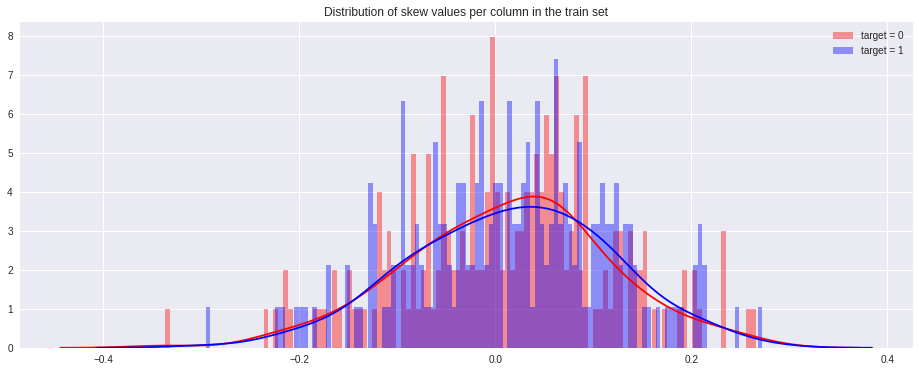

In [0]:
t0 = train.loc[train['target'] == 0]
t1 = train.loc[train['target'] == 1]
plt.figure(figsize=(16,6))
plt.title("Distribution of skew values per column in the train set")
sns.distplot(t0[features].skew(axis=0),color="red", kde=True,bins=120, label='target = 0')
sns.distplot(t1[features].skew(axis=0),color="blue", kde=True,bins=120, label='target = 1')
plt.legend(); plt.show()


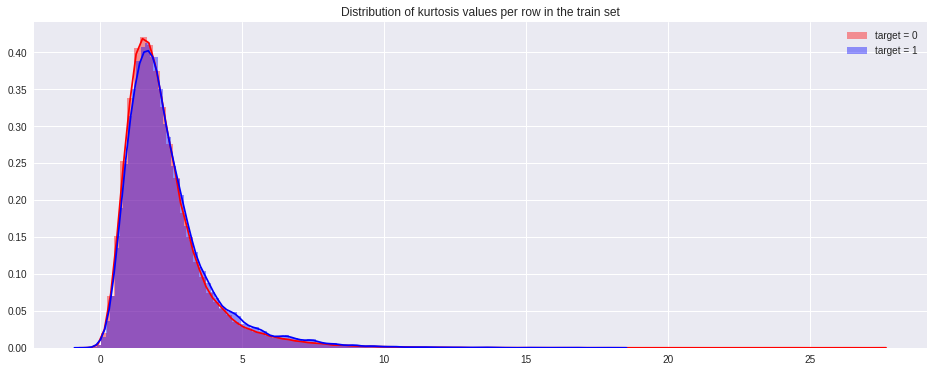

In [0]:
t0 = train.loc[train['target'] == 0]
t1 = train.loc[train['target'] == 1]
plt.figure(figsize=(16,6))
plt.title("Distribution of kurtosis values per row in the train set")
sns.distplot(t0[features].kurtosis(axis=1),color="red", kde=True,bins=120, label='target = 0')
sns.distplot(t1[features].kurtosis(axis=1),color="blue", kde=True,bins=120, label='target = 1')
plt.legend(); plt.show()


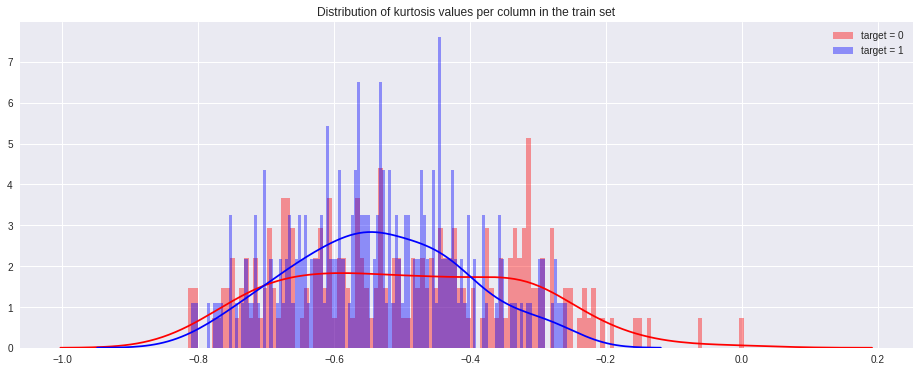

In [0]:
t0 = train.loc[train['target'] == 0]
t1 = train.loc[train['target'] == 1]
plt.figure(figsize=(16,6))
plt.title("Distribution of kurtosis values per column in the train set")
sns.distplot(t0[features].kurtosis(axis=0),color="red", kde=True,bins=120, label='target = 0')
sns.distplot(t1[features].kurtosis(axis=0),color="blue", kde=True,bins=120, label='target = 1')
plt.legend(); plt.show()


Least correlated variables

In [0]:
correlations = train[features].corr().abs().unstack().sort_values(kind="quicksort").reset_index()
correlations = correlations[correlations['level_0'] != correlations['level_1']]
correlations.head(10)


,level_0,level_1,0
0,var_75,var_191,2.703975e-08
1,var_191,var_75,2.703975e-08
2,var_173,var_6,5.942735e-08
3,var_6,var_173,5.942735e-08
4,var_126,var_109,1.313947e-07
5,var_109,var_126,1.313947e-07
6,var_144,var_27,1.772502e-07
7,var_27,var_144,1.772502e-07
8,var_177,var_100,3.116544e-07
9,var_100,var_177,3.116544e-07


The most highly correlated variables

In [0]:
correlations.tail(10)


,level_0,level_1,0
39790,var_183,var_189,0.009359
39791,var_189,var_183,0.009359
39792,var_174,var_81,0.009490
39793,var_81,var_174,0.009490
39794,var_81,var_165,0.009714
39795,var_165,var_81,0.009714
39796,var_53,var_148,0.009788
39797,var_148,var_53,0.009788
39798,var_26,var_139,0.009844
39799,var_139,var_26,0.009844


Every unique row will have atleast one value that is unique to that column in atleast one column . Any data with no unique data entry is a fake row and must be removed

In [0]:
features = train.columns.values[2:202]
unique_max_train = []
unique_max_test = []
for feature in features:
    values = train[feature].value_counts()
    unique_max_train.append([feature, values.max(), values.idxmax()])
    values = test[feature].value_counts()
    unique_max_test.append([feature, values.max(), values.idxmax()])


In [0]:
np.transpose((pd.DataFrame(unique_max_train, columns=['Feature', 'Max duplicates', 'Value'])).\
            sort_values(by = 'Max duplicates', ascending=False).head(15))
#Variables with many duplicate entries

,68,108,126,12,91,103,148,71,161,25,125,169,166,133,43
Feature,var_68,var_108,var_126,var_12,var_91,var_103,var_148,var_71,var_161,var_25,var_125,var_169,var_166,var_133,var_43
Max duplicates,1084,313,305,203,66,61,59,54,52,41,40,39,39,39,39
Value,5.0214,14.1999,11.5356,13.5545,6.9785,1.6662,4.0456,0.7031,5.7688,13.6723,12.5159,5.6941,2.7306,6.8632,11.4522


In [0]:
#Feature engineering using statistical parameters

In [0]:
idx = features = train.columns.values[2:202]
for df in [test, train]:
    df['sum'] = df[idx].sum(axis=1)  
    df['min'] = df[idx].min(axis=1)
    df['max'] = df[idx].max(axis=1)
    df['mean'] = df[idx].mean(axis=1)
    df['std'] = df[idx].std(axis=1)
    df['skew'] = df[idx].skew(axis=1)
    df['kurt'] = df[idx].kurtosis(axis=1)
    df['med'] = df[idx].median(axis=1)


In [0]:
train[train.columns[202:]].head()


,sum,min,max,mean,std,skew,kurt,med
0,1456.3182,-21.4494,43.1127,7.281591,9.331540,0.101580,1.331023,6.77040
1,1415.3636,-47.3797,40.5632,7.076818,10.336130,-0.351734,4.110215,7.22315
2,1240.8966,-22.4038,33.8820,6.204483,8.753387,-0.056957,0.546438,5.89940
3,1288.2319,-35.1659,38.1015,6.441159,9.594064,-0.480116,2.630499,6.70260
4,1354.2310,-65.4863,41.1037,6.771155,11.287122,-1.463426,9.787399,6.94735


In [0]:
test[test.columns[201:]].head()


,sum,min,max,mean,std,skew,kurt,med
0,1416.6404,-31.9891,42.0248,7.083202,9.910632,-0.088518,1.871262,7.31440
1,1249.6860,-41.1924,35.6020,6.248430,9.541267,-0.559785,3.391068,6.43960
2,1430.2599,-34.3488,39.3654,7.151299,9.967466,-0.135084,2.326901,7.26355
3,1411.4447,-21.4797,40.3383,7.057223,8.257204,-0.167741,2.253054,6.89675
4,1423.7364,-24.8254,45.5510,7.118682,10.043542,0.293484,2.044943,6.83375


In [0]:
def plot_new_feature_distribution(df1, df2, label1, label2, features):
    i = 0
    sns.set_style('whitegrid')
    plt.figure()
    fig, ax = plt.subplots(2,4,figsize=(18,8))

    for feature in features:
        i += 1
        plt.subplot(2,4,i)
        sns.kdeplot(df1[feature], bw=0.5,label=label1)
        sns.kdeplot(df2[feature], bw=0.5,label=label2)
        plt.xlabel(feature, fontsize=11)
        locs, labels = plt.xticks()
        plt.tick_params(axis='x', which='major', labelsize=8)
        plt.tick_params(axis='y', which='major', labelsize=8)
    plt.show();


Plot distributions of new dataframe after feature engineering

<Figure size 576x396 with 0 Axes>

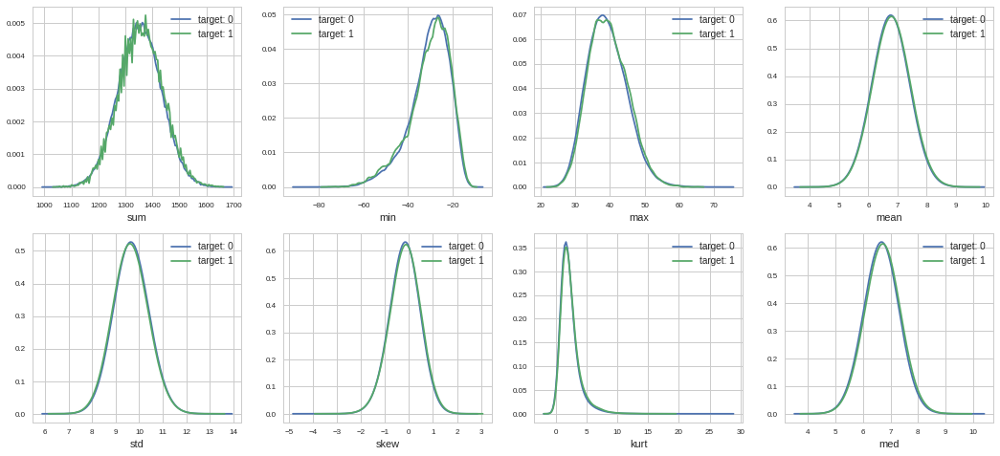

In [0]:
t0 = train.loc[train['target'] == 0]
t1 = train.loc[train['target'] == 1]
features = train.columns.values[202:]
plot_new_feature_distribution(t0, t1, 'target: 0', 'target: 1', features)


<Figure size 576x396 with 0 Axes>

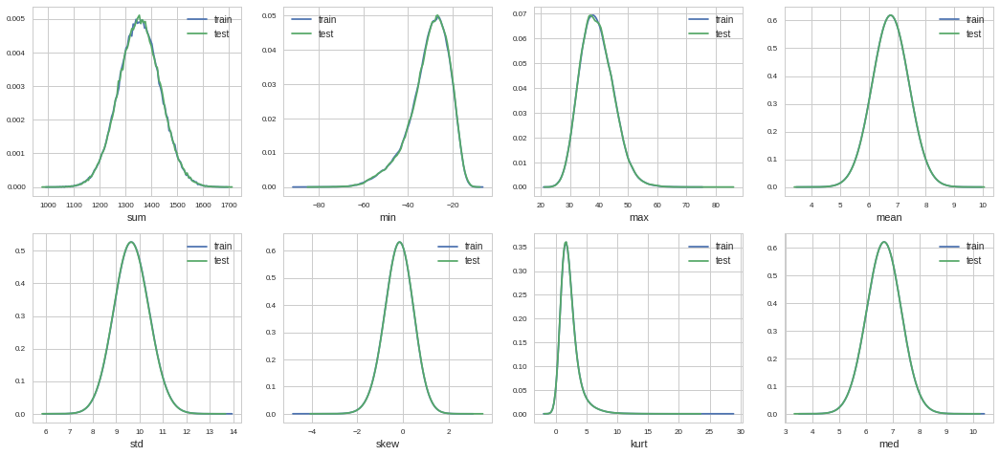

In [0]:
features = train.columns.values[202:]
plot_new_feature_distribution(train, test, 'train', 'test', features)


In [0]:
features = [c for c in train.columns if c not in ['ID_code', 'target']]
for feature in features:
    train['r2_'+feature] = np.round(train[feature], 2)
    test['r2_'+feature] = np.round(test[feature], 2)
    train['r1_'+feature] = np.round(train[feature], 1)
    test['r1_'+feature] = np.round(test[feature], 1)



In [0]:
print('Train and test columns: {} {}'.format(len(train.columns), len(test.columns)))


Train and test columns: 626 625


####Perform lgbm after removing fake values

In [0]:
features = [c for c in train.columns if c not in ['ID_code', 'target']]
target = train['target']

####set parameters for lgbm

In [0]:
param = {
    'bagging_freq': 5,
    'bagging_fraction': 0.4,
    'boost_from_average':'false',
    'boost': 'gbdt',
    'feature_fraction': 0.05,
    'learning_rate': 0.01,
    'max_depth': -1,  
    'metric':'auc',
    'min_data_in_leaf': 80,
    'min_sum_hessian_in_leaf': 10.0,
    'num_leaves': 13,
    'num_threads': 8,
    'tree_learner': 'serial',
    'objective': 'binary', 
    'verbosity': 1
}

In [0]:
folds = StratifiedKFold(n_splits=10, shuffle=False, random_state=4400)#10 Folds
oof = np.zeros(len(train))
predictions = np.zeros(len(test))
feature_importance_df = pd.DataFrame()

for fold_, (trn_idx, val_idx) in enumerate(folds.split(train.values, target.values)):
    print("Fold {}".format(fold_))
    trn_data = lgb.Dataset(train.iloc[trn_idx][features], label=target.iloc[trn_idx])
    val_data = lgb.Dataset(train.iloc[val_idx][features], label=target.iloc[val_idx])

    num_round = 1000000
    clf = lgb.train(param, trn_data, num_round, valid_sets = [trn_data, val_data], verbose_eval=1000, early_stopping_rounds = 3000)
    oof[val_idx] = clf.predict(train.iloc[val_idx][features], num_iteration=clf.best_iteration)
    
    fold_importance_df = pd.DataFrame()
    fold_importance_df["Feature"] = features
    fold_importance_df["importance"] = clf.feature_importance()
    fold_importance_df["fold"] = fold_ + 1
    feature_importance_df = pd.concat([feature_importance_df, fold_importance_df], axis=0)
    
    predictions += clf.predict(test[features], num_iteration=clf.best_iteration) / folds.n_splits

print("CV score: {:<8.5f}".format(roc_auc_score(target, oof)))


Fold 0
Training until validation scores don't improve for 3000 rounds.
[1000]	training's auc: 0.89904	valid_1's auc: 0.880364
[2000]	training's auc: 0.911204	valid_1's auc: 0.888868
[3000]	training's auc: 0.91903	valid_1's auc: 0.893151
[4000]	training's auc: 0.924854	valid_1's auc: 0.896012
[5000]	training's auc: 0.929701	valid_1's auc: 0.897714
[6000]	training's auc: 0.933934	valid_1's auc: 0.898494
[7000]	training's auc: 0.93786	valid_1's auc: 0.898994
[8000]	training's auc: 0.941613	valid_1's auc: 0.89928
[9000]	training's auc: 0.945152	valid_1's auc: 0.899671
[10000]	training's auc: 0.948466	valid_1's auc: 0.899878
[11000]	training's auc: 0.951758	valid_1's auc: 0.900177
[12000]	training's auc: 0.954863	valid_1's auc: 0.899992
[13000]	training's auc: 0.957793	valid_1's auc: 0.899881
[14000]	training's auc: 0.96065	valid_1's auc: 0.899628
Early stopping, best iteration is:
[11045]	training's auc: 0.951908	valid_1's auc: 0.900223
Fold 1
Training until validation scores don't improve


To seperate real and synthetic(fake) samples in dataset

In [0]:
from sklearn.metrics import roc_auc_score, log_loss
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import StratifiedKFold,KFold
from scipy.stats import norm, skew

from tqdm import tqdm_notebook as tqdm
from copy import copy
from multiprocessing import Pool

import warnings
warnings.filterwarnings('ignore')
np.random.seed(42)

In [0]:
df_test=test
df_test.drop(['ID_code'], axis=1, inplace=True)
df_test = df_test.values

unique_samples = []
unique_count = np.zeros_like(df_test)
for feature in tqdm(range(df_test.shape[1])):
    _, index_, count_ = np.unique(df_test[:, feature], return_counts=True, return_index=True)
    unique_count[index_[count_ == 1], feature] += 1

# Samples which have unique values are real the others are fake
real_samples_indexes = np.argwhere(np.sum(unique_count, axis=1) > 0)[:, 0]
synthetic_samples_indexes = np.argwhere(np.sum(unique_count, axis=1) == 0)[:, 0]

print(len(real_samples_indexes))
print(len(synthetic_samples_indexes))



100000
100000


###Choice of  lgbm and aggregate of all individual lgbms to obtain cumulative output

In [0]:
params = {
    'boost_from_average':'false',
    'boost': 'gbdt',
    'feature_fraction': 1,
    'learning_rate': 0.08,
    'max_depth': -1,
    'metric':'binary_logloss',
    'num_leaves': 4,
    'num_threads': 8,
    'tree_learner': 'serial',
    'objective': 'binary',
    'reg_alpha': 2,
    'reg_lambda': 0,
    'verbosity': 1,
    'max_bin':256,
}

# reg_alpha
reg_alpha_values = [0.75, 1, 2, 3]
reg_alpha_var = [3, 0, 2, 3, 2, 0, 1, 1, 3, 2, 2, 0, 2, 0, 2, 2, 2, 1, 1, 2, 1, 2, 3, 3, 2, 1, 3, 1, 3, 2, 2, 3, 1, 1, 3, 2, 0, 1, 0, 2, 1, 1, 2, 3, 0, 3, 3, 3, 2, 0, 3, 1, 3, 1, 1, 0, 2, 2, 0, 0, 0, 1, 2, 1, 0, 1, 3, 2, 0, 2, 1, 2, 0, 0, 1, 3, 3, 1, 2, 3, 3, 2, 0, 1, 2, 3, 3, 2, 3, 3, 0, 0, 3, 0, 1, 0, 1, 0, 2, 3, 1, 0, 3, 1, 3, 2, 3, 1, 3, 3, 3, 1, 3, 2, 3, 2, 1, 0, 1, 2, 0, 3, 0, 3, 0, 3, 2, 1, 0, 0, 2, 2, 2, 0, 1, 0, 0, 2, 3, 2, 2, 1, 1, 0, 1, 2, 2, 2, 1, 0, 2, 3, 2, 3, 1, 1, 3, 1, 1, 2, 1, 2, 0, 3, 1, 3, 3, 2, 0, 1, 3, 3, 0, 1, 0, 3, 1, 3, 1, 3, 0, 3, 0, 3, 1, 0, 0, 0, 3, 0, 3, 0, 0, 2, 0, 3, 1, 0, 3, 2]

# max_bin
max_bin_values = [256, 512, 1024]
max_bin_var = [0, 0, 1, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 1, 1, 1, 0, 0, 0, 0, 2, 2, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 2, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 2, 1, 1, 1, 1, 0, 0, 0, 0, 1, 2, 1, 0, 0, 1, 2, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 2, 1, 0, 0, 0, 2, 0, 1, 1, 0, 1, 0, 0, 1, 2, 1, 2, 1, 0, 0, 1, 0, 2, 0, 1, 0, 0, 2, 1, 1, 1, 0, 0, 0, 2, 0, 0, 2, 1, 0, 0, 1, 0, 1, 2, 0, 0, 0, 0, 0, 2, 2, 2, 2, 1, 1, 2, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 2, 0, 1, 0, 1, 1, 0, 2, 1, 1, 1, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 2, 0, 1, 0, 1, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 1, 1, 0, 2, 0, 0, 0, 1, 2, 0, 0, 1, 0, 2]

# learning_rate
learning_rate_values = [0.06, 0.08, 0.12]
learning_rate_var = [2, 2, 2, 1, 2, 2, 2, 0, 1, 2, 0, 2, 2, 2, 0, 2, 2, 0, 2, 1, 2, 2, 2, 2, 2, 0, 1, 0, 2, 0, 0, 2, 0, 2, 2, 2, 1, 2, 0, 0, 2, 0, 0, 1, 2, 1, 2, 0, 0, 2, 1, 2, 2, 2, 2, 0, 0, 2, 1, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 0, 2, 2, 1, 0, 1, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 1, 1, 1, 2, 0, 2, 0, 2, 0, 2, 1, 0, 0, 1, 2, 0, 2, 2, 2, 0, 2, 2, 2, 2, 1, 0, 2, 1, 2, 2, 1, 2, 0, 2, 0, 2, 2, 2, 2, 2, 2, 1, 2, 1, 0, 2, 1, 1, 2, 2, 2, 2, 0, 2, 1, 2, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 0, 1, 2, 0, 2, 2, 0, 1, 2, 2, 2, 1, 0, 1, 2, 1, 2, 1, 1, 1, 2, 1, 2, 1, 0, 0, 2, 0, 1, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1]

# num_leaves
num_leaves_values = [3, 4, 5]
num_leaves_var = [1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 2, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 2, 2, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 2, 1, 2, 0, 0, 0, 0, 0, 1, 1, 0, 0, 2, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 2, 0, 0, 0, 0, 1, 0, 1, 2, 1, 1, 1, 0, 2, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 1, 2, 0, 1, 0, 2, 2, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 2, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 2, 0, 0, 0, 0, 1, 0, 0, 2, 1, 0, 1, 2, 1, 1, 0, 0, 0, 2, 1, 2]

In [0]:
n_folds = 5
early_stopping_rounds=10
settings = [4]
np.random.seed(47)

settings_best_ind = []

def train_trees():
    preds_oof = np.zeros((len(X_train), len(features)))
    preds_test = np.zeros((len(X_test), len(features)))
    preds_train = np.zeros((len(X_train), len(features)))
    preds_fake = np.zeros((len(X_fake), len(features)))

    features_used_flatten = [var for sublist in features_used for var in sublist]
    X_train_used = X_train[features_used_flatten]
    X_test_used = X_test[features_used_flatten]
    X_fake_used = X_fake[features_used_flatten]

    for i in range(len(features)):
        params['max_bin'] = max_bin_values[max_bin_var[i]]
        params['learning_rate'] = learning_rate_values[learning_rate_var[i]]
        params['reg_alpha'] = reg_alpha_values[reg_alpha_var[i]]
        params['num_leaves'] = num_leaves_values[num_leaves_var[i]]
        features_train = [feature_set[i] for feature_set in features_used] 
        print(f'Training on: {features_train}')
        folds = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=np.random.randint(100000))
        list_folds = list(folds.split(X_train_used.values, target_train.values))
        preds_oof_temp = np.zeros((preds_oof.shape[0], len(settings)))
        preds_test_temp = np.zeros((preds_test.shape[0], len(settings)))
        preds_train_temp = np.zeros((preds_train.shape[0], len(settings)))
        preds_fake_temp = np.zeros((preds_fake.shape[0], len(settings)))

        scores = []
        for j, setting in enumerate(settings):
            # setting is used for hyperparameter tuning, here you can add sometinh like params['num_leaves'] = setting
            print('\nsetting: ', setting)
            for k, (trn_idx, val_idx) in enumerate(list_folds):
                print("Fold: {}".format(k+1), end="")
                trn_data = lgb.Dataset(X_train_used.iloc[trn_idx][features_train], label=target_train.iloc[trn_idx])
                val_data = lgb.Dataset(X_train_used.iloc[val_idx][features_train], label=target_train.iloc[val_idx])

                # Binary Log Loss
                clf = lgb.train(params, trn_data, 2000, valid_sets=[trn_data, val_data], verbose_eval=False, early_stopping_rounds=early_stopping_rounds) 

                prediction_val1 = clf.predict(X_train_used.iloc[val_idx][features_train])
                prediction_test1 = clf.predict(X_test_used[features_train])
                prediction_train1 = clf.predict(X_train_used.iloc[trn_idx][features_train])
                prediction_fake1 = clf.predict(X_fake_used[features_train])

                # Predictions
                s1 = roc_auc_score(target_train.iloc[val_idx], prediction_val1)
                s1_log = log_loss(target_train.iloc[val_idx], prediction_val1)
                print(' - val AUC: {:<8.4f} - loss: {:<8.3f}'.format(s1, s1_log*1000), end='')

                # Predictions Test
                if use_experimental:
                    s1_test = roc_auc_score(target_test, prediction_test1)
                    s1_log_test = log_loss(target_test, prediction_test1)
                    print(' - test AUC: {:<8.4f} - loss: {:<8.3f}'.format(s1_test, s1_log_test*1000), end='')

                # Predictions Train
                s1_train = roc_auc_score(target_train.iloc[trn_idx], prediction_train1)
                s1_log_train = log_loss(target_train.iloc[trn_idx], prediction_train1)
                print(' - train AUC: {:<8.4f} - loss: {:<8.3f}'.format(s1_train, s1_log_train*1000), end='')
                if use_experimental:
                    print('',clf.feature_importance(), end='')

                print('')


                preds_oof_temp[val_idx,j] += np.sqrt(prediction_val1 - prediction_val1.mean() + 0.1) 
                preds_test_temp[:,j] += np.sqrt(prediction_test1 - prediction_test1.mean() + 0.1) / n_folds
                preds_train_temp[trn_idx,j] += np.sqrt(prediction_train1 - prediction_train1.mean() + 0.1) / (n_folds-1)
                preds_fake_temp[:,j] += np.sqrt(prediction_fake1 - prediction_fake1.mean() + 0.1) / n_folds

            score_setting = roc_auc_score(target_train, preds_oof_temp[:,j])
            score_setting_log = 1000*log_loss(target_train, np.exp(preds_oof_temp[:,j]))
            scores.append(score_setting_log)
            print("Score:  - val AUC: {:<8.4f} - loss: {:<8.3f}".format(score_setting, score_setting_log), end='')
            if use_experimental:
                score_setting_test = roc_auc_score(target_test, preds_test_temp[:,j])
                score_setting_log_test = 1000*log_loss(target_test, np.exp(preds_test_temp[:,j]))  
                print(" - test AUC: {:<8.4f} - loss: {:<8.3f}".format(score_setting_test, score_setting_log_test), end='')

            score_setting_train = roc_auc_score(target_train, preds_train_temp[:,j])
            score_setting_log_train = 1000*log_loss(target_train, np.exp(preds_train_temp[:,j]))
            print(" - train AUC: {:<8.4f} - loss: {:<8.3f}".format(score_setting_train, score_setting_log_train))

        best_ind = np.argmin(scores)
        settings_best_ind.append(best_ind)
        preds_oof[:,i] = preds_oof_temp[:,best_ind]
        preds_test[:,i] = preds_test_temp[:,best_ind]
        preds_train[:,i] = preds_train_temp[:,best_ind]
        preds_fake[:,i] = preds_fake_temp[:,best_ind]


        print('\nbest setting: ', settings[best_ind])
        preds_oof_cum = preds_oof[:,:i+1].mean(axis=1)
        print("Cum CV val  : {:<8.4f} - loss: {:<8.3f}".format(roc_auc_score(target_train, preds_oof_cum), 1000*log_loss(target_train, np.exp(preds_oof_cum))))
        if use_experimental:        
            preds_test_cum = preds_test[:,:i+1].mean(axis=1)
            print("Cum CV test : {:<8.4f} - loss: {:<8.3f}".format(roc_auc_score(target_test, preds_test_cum), 1000*log_loss(target_test, np.exp(preds_test_cum))))
        preds_train_cum = preds_train[:,:i+1].mean(axis=1)
        print("Cum CV train: {:<8.4f} - loss: {:<8.3f}".format(roc_auc_score(target_train, preds_train_cum), 1000*log_loss(target_train, np.exp(preds_train_cum))))
        print('*****' * 10 + '\n')
        
    return preds_oof, preds_test, preds_train, preds_fake

preds_oof, preds_test, preds_train, preds_fake = train_trees()


Training on: ['var_0', 'var_0_count']

setting:  4
Fold: 1 - val AUC: 0.5582   - loss: 323.269  - train AUC: 0.5552   - loss: 323.639 
Fold: 2 - val AUC: 0.5479   - loss: 323.996  - train AUC: 0.5552   - loss: 323.584 
Fold: 3 - val AUC: 0.5419   - loss: 324.190  - train AUC: 0.5561   - loss: 323.559 
Fold: 4 - val AUC: 0.5524   - loss: 323.488  - train AUC: 0.5569   - loss: 323.556 
Fold: 5 - val AUC: 0.5482   - loss: 324.035  - train AUC: 0.5592   - loss: 323.411 
Score:  - val AUC: 0.5491   - loss: 31068.694 - train AUC: 0.5585   - loss: 31068.694

best setting:  4
Cum CV val  : 0.5491   - loss: 31068.694
Cum CV train: 0.5585   - loss: 31068.694
**************************************************

Training on: ['var_1', 'var_1_count']

setting:  4
Fold: 1 - val AUC: 0.5547   - loss: 323.721  - train AUC: 0.5492   - loss: 323.713 
Fold: 2 - val AUC: 0.5396   - loss: 324.233  - train AUC: 0.5529   - loss: 323.625 
Fold: 3 - val AUC: 0.5418   - loss: 324.060  - train AUC: 0.5534   - los

In [0]:
preds_oof_cum = np.zeros(preds_oof.shape[0])
if use_experimental:
    preds_test_cum = np.zeros(preds_test.shape[0])
preds_train_cum = np.zeros(preds_train.shape[0])
for i in range(len(features)):
    preds_oof_cum += preds_oof[:,i]
    preds_train_cum += preds_train[:,i]
    print("var_{} Cum val: {:<8.5f}".format(i,roc_auc_score(target_train, preds_oof_cum)), end="")
    if use_experimental:
        preds_test_cum += preds_test[:,i]
        print(" - test : {:<8.5f}".format(roc_auc_score(target_test, preds_test_cum)), end="")
    print(" - train: {:<8.5f}".format(roc_auc_score(target_train, preds_train_cum)))


var_0 Cum val: 0.54906  - train: 0.55850 
var_1 Cum val: 0.57485  - train: 0.58226 
var_2 Cum val: 0.59720  - train: 0.60543 
var_3 Cum val: 0.59893  - train: 0.60803 
var_4 Cum val: 0.59928  - train: 0.61003 
var_5 Cum val: 0.60839  - train: 0.62002 
var_6 Cum val: 0.62851  - train: 0.63880 
var_7 Cum val: 0.62851  - train: 0.63880 
var_8 Cum val: 0.63049  - train: 0.64175 
var_9 Cum val: 0.64118  - train: 0.65268 
var_10 Cum val: 0.64118  - train: 0.65268 
var_11 Cum val: 0.64365  - train: 0.65668 
var_12 Cum val: 0.66050  - train: 0.67297 
var_13 Cum val: 0.67179  - train: 0.68405 
var_14 Cum val: 0.67179  - train: 0.68405 
var_15 Cum val: 0.67279  - train: 0.68580 
var_16 Cum val: 0.67305  - train: 0.68673 
var_17 Cum val: 0.67305  - train: 0.68673 
var_18 Cum val: 0.68082  - train: 0.69517 
var_19 Cum val: 0.68176  - train: 0.69678 
var_20 Cum val: 0.68365  - train: 0.69920 
var_21 Cum val: 0.69445  - train: 0.70989 
var_22 Cum val: 0.70388  - train: 0.71943 
var_23 Cum val: 0.705

##CNN Algorithm implemented by self

In [0]:
import keras

n_splits = 7
num_preds = 5
epochs = 60
learning_rate_init = 0.02
batch_size = 4000

num_features = len(features)

def get_features(preds, df):
    list_features = [preds, df[features].values, df[features_count].values, df[features_deviation], df[features_density]]
    list_indices = []
    for i in range(num_features):
        indices = np.arange(num_preds)*num_features + i
        list_indices.append(indices)
    indices = np.concatenate(list_indices)
    feats = np.concatenate(list_features, axis=1)[:,indices]
    return feats 

def get_model_3():
    inp = keras.layers.Input((num_features*num_preds,))
    x = keras.layers.Reshape((num_features*num_preds,1))(inp)
    x = keras.layers.Conv1D(32,num_preds,strides=num_preds, activation='elu')(x)
    x = keras.layers.BatchNormalization()(x)
    x = keras.layers.Conv1D(24,1, activation='elu')(x)
    x = keras.layers.BatchNormalization()(x)
    x = keras.layers.Conv1D(16,1, activation='elu')(x)
    x = keras.layers.BatchNormalization()(x)
    x = keras.layers.Conv1D(4,1, activation='elu')(x)
    x = keras.layers.Flatten()(x)
    x = keras.layers.Reshape((num_features*4,1))(x)
    x = keras.layers.AveragePooling1D(2)(x)
    x = keras.layers.Flatten()(x)
    x = keras.layers.BatchNormalization()(x)
    out = keras.layers.Dense(1, activation='sigmoid')(x)
    return keras.Model(inputs=inp, outputs=out)


def lr_scheduler(epoch):
    if epoch <= epochs*0.8:
        return learning_rate_init
    else:
        return learning_rate_init * 0.1

def train_NN(features_oof, features_test, features_train, features_fake):
    
    folds = StratifiedKFold(n_splits=n_splits)

    preds_nn_oof = np.zeros(features_oof.shape[0])
    preds_nn_test = np.zeros(features_test.shape[0])
    preds_nn_fake = np.zeros(features_fake.shape[0])

    for trn_idx, val_idx in folds.split(features_oof, target_train):
        features_oof_tr = features_oof[trn_idx, :]
        target_oof_tr = target_train.values[trn_idx]
        features_oof_val = features_oof[val_idx, :]
        target_oof_val = target_train.values[val_idx]

        optimizer = keras.optimizers.Adam(lr = learning_rate_init, decay = 0.00001)
        model = get_model_3()
        callbacks = []
        callbacks.append(keras.callbacks.LearningRateScheduler(lr_scheduler))
        model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
        model.fit(features_oof_tr, target_oof_tr, validation_data=(features_oof_val, target_oof_val), epochs=epochs, verbose=2, batch_size=batch_size, callbacks=callbacks)

        preds_nn_oof += model.predict(features_oof, batch_size=2000)[:,0]
        preds_nn_test += model.predict(features_test, batch_size=2000)[:,0]
        preds_nn_fake += model.predict(features_fake, batch_size=2000)[:,0]

        print(roc_auc_score(target_train, preds_nn_oof))
        if use_experimental:
            print(roc_auc_score(target_test, preds_nn_test))
            print(roc_auc_score(target_test, preds_test.mean(axis=1)))

    preds_nn_oof /= n_splits
    preds_nn_test /= n_splits
    preds_nn_fake /= n_splits
    return preds_nn_oof, preds_nn_test, preds_nn_fake


features_oof = get_features(preds_oof, X_train)
features_test = get_features(preds_test, X_test)
if not use_experimental:
    del X_test
features_train = get_features(preds_train, X_train)
if not use_experimental:
    del X_train
features_fake = get_features(preds_fake, X_fake)
if not use_experimental:
    del X_fake
    del preds_oof
    del preds_fake
    del preds_train
    del preds_test

print(get_model_3().summary())
    
preds_nn_oof, preds_nn_test, preds_nn_fake = train_NN(features_oof, features_test, features_train, features_fake)

print(roc_auc_score(target_train, preds_nn_oof))
if use_experimental:
    print('test AUC: ', roc_auc_score(target_test, preds_nn_test))


Using TensorFlow backend.


Instructions for updating:
Colocations handled automatically by placer.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 1000)              0         
_________________________________________________________________
reshape_1 (Reshape)          (None, 1000, 1)           0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 200, 32)           192       
_________________________________________________________________
batch_normalization_1 (Batch (None, 200, 32)           128       
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 200, 24)           792       
_________________________________________________________________
batch_normalization_2 (Batch (None, 200, 24)           96        
_________________________________________________________________
conv